# 02 - EDA 

According to the CRISP-DM process, Exploratory Data Analysis is a critical activity for data understanding before moving into data modelling process. This activity provides answers to the data mining questions using querying, visualizing and reporting.

## 2.1 Import Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

from scipy.stats import boxcox

## 2.2 Configuration

In [2]:
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)

## 2.3 Load dataset

In [3]:
path = 'C:\\Users\\DELL\\Documents\\Ushani\\Data Science\\Uni Malaya\\Courses\\Semester - 3\\Project\\Submission\\P2\\Codes\\Data_2011_2012_2013.csv'
df = pd.read_csv(path,index_col = 'Date', parse_dates = True)
#df = pd.read_csv(path,parse_dates = True)

In [4]:
df.head()

,Dates,Year,Month,Day,Hour,MeanWS,MeanWD,MaxGustWS,MaxGustWD,OpenAirTempInst,OpenAirTempMax,OpenAirTempMin,Module1TempInst,Module1TempMax,Module1TempMin,Module2TempInst,Module2TempMax,Module2TempMin,Module3TempInst,Module3TempMax,Module3TempMin,Module4TempInst,Module4TempMax,Module4TempMin,Module5TempInst,Module5TempMax,Module5TempMin,Module6TempInst,Module6TempMax,Module6TempMin,Precipitation,GlobalSolarRadiation,TiltSolarIrradiance,DiffuseSolarIrradiance,PowerInst,PowerMax,PowerMin,Energy,CO2Reduction
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-07-21 01:00:00,2011-07-21 00:00:00,2011,7,21,1,5.0,WSW,8.2,WSW,25.6,25.6,25.5,23.9,24.0,23.8,23.4,23.5,23.3,23.4,23.4,23.2,23.0,23.0,22.9,23.3,23.4,23.2,23.8,23.8,23.6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2011-07-21 02:00:00,2011-07-21 00:00:00,2011,7,21,2,3.6,WSW,6.8,SW,25.5,25.6,25.4,24.2,24.2,23.8,23.7,23.7,23.4,23.6,23.6,23.2,23.4,23.4,22.8,23.6,23.6,23.1,24.1,24.1,23.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2011-07-21 03:00:00,2011-07-21 00:00:00,2011,7,21,3,4.0,WSW,6.7,WSW,25.7,25.8,25.5,23.8,24.2,23.7,23.3,23.7,23.2,23.2,23.6,23.1,23.0,23.5,22.9,23.3,23.8,23.2,23.8,24.4,23.7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2011-07-21 04:00:00,2011-07-21 00:00:00,2011,7,21,4,3.2,WSW,5.9,WSW,25.3,25.7,25.3,23.4,24.0,23.4,23.0,23.5,23.0,22.9,23.4,22.9,22.5,23.2,22.5,22.8,23.5,22.8,23.3,24.0,23.3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2011-07-21 05:00:00,2011-07-21 00:00:00,2011,7,21,5,3.8,WSW,5.5,WSW,25.2,25.4,25.1,23.3,23.5,23.3,22.8,23.0,22.8,22.8,22.9,22.7,22.3,22.5,22.3,22.6,22.8,22.6,23.1,23.2,23.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## 2.4 Exploratary Data Analysis

In [5]:
# identify columns and datatype
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 21471 entries, 2011-07-21 01:00:00 to 2013-12-31 23:00:00
Data columns (total 39 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Dates                   21471 non-null  object 
 1   Year                    21471 non-null  int64  
 2   Month                   21471 non-null  int64  
 3   Day                     21471 non-null  int64  
 4   Hour                    21471 non-null  int64  
 5   MeanWS                  21471 non-null  float64
 6   MeanWD                  21471 non-null  object 
 7   MaxGustWS               21471 non-null  float64
 8   MaxGustWD               21471 non-null  object 
 9   OpenAirTempInst         21471 non-null  float64
 10  OpenAirTempMax          21471 non-null  float64
 11  OpenAirTempMin          21471 non-null  float64
 12  Module1TempInst         21471 non-null  float64
 13  Module1TempMax          21471 non-null  float64
 14  Mod

In [6]:
# Summary statistics of numerical columns
df.describe()

,Year,Month,Day,Hour,MeanWS,MaxGustWS,OpenAirTempInst,OpenAirTempMax,OpenAirTempMin,Module1TempInst,Module1TempMax,Module1TempMin,Module2TempInst,Module2TempMax,Module2TempMin,Module3TempInst,Module3TempMax,Module3TempMin,Module4TempInst,Module4TempMax,Module4TempMin,Module5TempInst,Module5TempMax,Module5TempMin,Module6TempInst,Module6TempMax,Module6TempMin,Precipitation,GlobalSolarRadiation,TiltSolarIrradiance,DiffuseSolarIrradiance,PowerInst,PowerMax,PowerMin,Energy,CO2Reduction
count,21471.000000,21471.000000,21471.000000,21471.000000,21471.000000,21471.000000,21471.000000,21471.000000,21471.000000,21471.000000,21471.000000,21471.000000,21471.000000,21471.000000,21471.000000,21471.00000,21471.000000,21471.000000,21471.000000,21471.000000,21471.000000,21327.000000,21327.000000,21342.000000,21471.000000,21471.000000,21471.00000,21387.000000,21471.000000,21471.000000,21471.000000,21321.000000,21403.000000,21403.000000,21471.000000,21471.000000
mean,2012.225234,7.121187,15.868148,11.497508,3.671678,7.081892,27.005696,27.604788,26.469904,31.882712,34.317111,29.558158,31.095450,33.464440,28.824754,31.01468,33.390653,28.738401,29.855349,32.067081,27.742592,30.175304,32.382056,28.066386,30.468972,32.719906,28.32529,0.144153,0.838649,0.820223,0.386842,128.638572,185.511564,58.335000,127.727167,22.990890
std,0.734941,3.432649,8.833089,6.921563,2.027265,3.698919,3.091277,3.384646,2.817831,12.099546,14.085568,9.814119,11.761446,13.680683,9.548337,11.86195,13.803256,9.626551,11.055017,12.919696,8.905865,10.970738,12.830278,8.835962,11.025688,12.958118,8.81484,1.291017,1.156294,1.101765,0.526517,186.698614,239.925451,102.465985,176.708018,31.807443
min,2011.000000,1.000000,1.000000,0.000000,0.000000,0.000000,18.900000,19.600000,18.900000,15.300000,15.800000,15.000000,14.700000,15.400000,14.600000,14.70000,15.500000,14.700000,14.800000,15.400000,14.400000,14.600000,15.400000,14.500000,15.400000,16.000000,15.40000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2012.000000,4.000000,8.000000,5.000000,2.100000,4.000000,24.600000,24.900000,24.300000,23.100000,23.400000,22.800000,22.400000,22.800000,22.100000,22.30000,22.700000,22.000000,21.900000,22.200000,21.600000,22.200000,22.600000,21.900000,22.500000,22.900000,22.30000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2012.000000,8.000000,16.000000,11.000000,3.300000,6.400000,26.200000,26.600000,25.700000,24.900000,25.700000,24.300000,24.400000,25.300000,23.700000,24.20000,25.100000,23.600000,23.800000,24.600000,23.200000,24.200000,25.000000,23.600000,24.400000,25.200000,23.80000,0.000000,0.010000,0.020000,0.010000,0.000000,5.000000,0.000000,0.000000,0.000000
75%,2013.000000,10.000000,24.000000,17.000000,5.000000,9.500000,29.400000,30.400000,28.500000,40.600000,45.800000,35.700000,39.700000,44.700000,35.000000,39.60000,44.500000,34.900000,37.000000,41.600000,33.000000,37.500000,42.000000,33.400000,37.700000,42.200000,33.60000,0.000000,1.680000,1.690000,0.710000,235.000000,395.000000,96.000000,260.000000,46.800000
max,2013.000000,12.000000,31.000000,23.000000,12.000000,24.900000,36.400000,37.200000,35.400000,76.500000,79.300000,68.900000,75.600000,77.600000,66.700000,76.20000,79.400000,67.000000,74.500000,77.200000,67.700000,83.800000,85.200000,76.400000,77.800000,78.500000,68.60000,42.500000,4.090000,3.810000,3.970000,729.000000,759.000000,588.000000,630.000000,113.400000


In [7]:
df.columns

Index(['Dates', 'Year', 'Month', 'Day', 'Hour', 'MeanWS', 'MeanWD',
       'MaxGustWS', 'MaxGustWD', 'OpenAirTempInst', 'OpenAirTempMax',
       'OpenAirTempMin', 'Module1TempInst', 'Module1TempMax', 'Module1TempMin',
       'Module2TempInst', 'Module2TempMax', 'Module2TempMin',
       'Module3TempInst', 'Module3TempMax', 'Module3TempMin',
       'Module4TempInst', 'Module4TempMax', 'Module4TempMin',
       'Module5TempInst', 'Module5TempMax', 'Module5TempMin',
       'Module6TempInst', 'Module6TempMax', 'Module6TempMin', 'Precipitation',
       'GlobalSolarRadiation', 'TiltSolarIrradiance', 'DiffuseSolarIrradiance',
       'PowerInst', 'PowerMax', 'PowerMin', 'Energy', 'CO2Reduction'],
      dtype='object')

In [8]:
df.shape

(21471, 39)

### 2.4.1 Distribution of features for total period

#### a). Wind Speed (Mean and MaxGust)

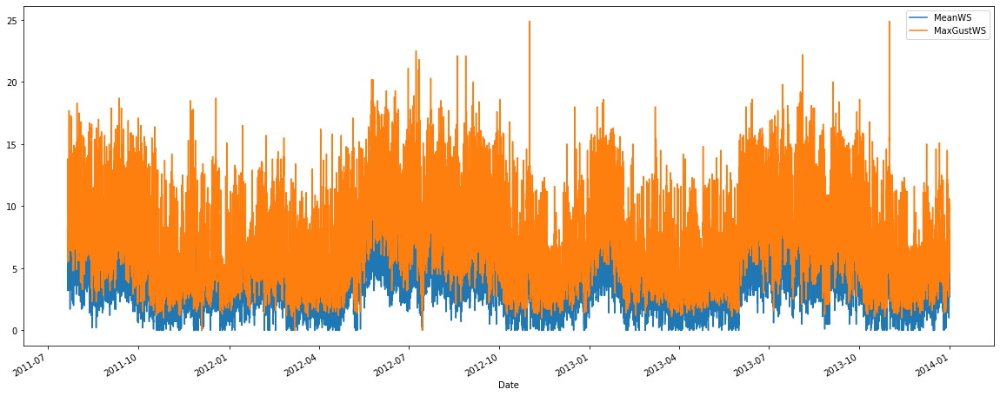

In [9]:
df[['MeanWS','MaxGustWS']].plot(figsize = (20,8));

#### b). Wind Direction (Mean and MaxGust)

In [10]:
df['MeanWD'].unique()

array(['WSW', 'W', 'SW', 'WNW', 'NW', 'SSW', 'CALM', 'NNW', 'NNE', 'N',
       'S', 'ESE', 'SSE', 'E', 'SE', 'NE', 'ENE'], dtype=object)

In [11]:
df['MaxGustWD'].unique()

array(['WSW', 'SW', 'W', 'WNW', 'NW', 'SSW', 'N', 'S', 'NNE', 'NNW',
       'SSE', 'E', 'ESE', 'SE', 'NE', 'ENE'], dtype=object)

#### c). Open Air Temperature

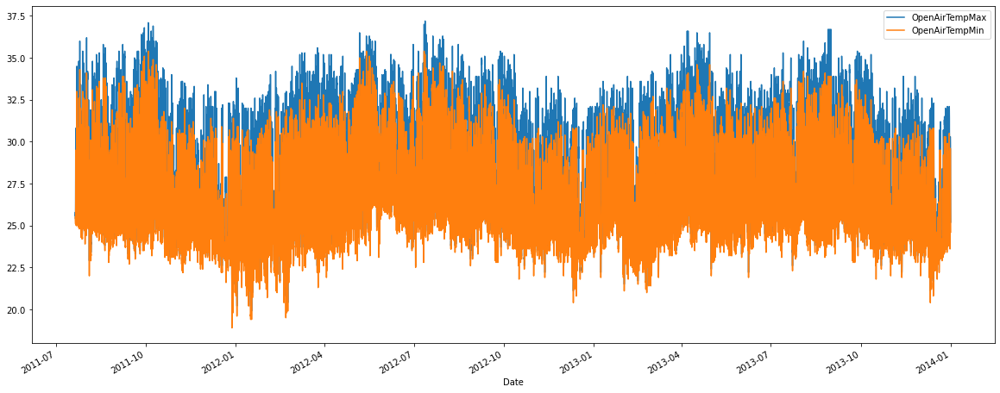

In [12]:
df[['OpenAirTempMax','OpenAirTempMin']].plot(figsize = (20,8));

#### d). Module Temperature (Max)

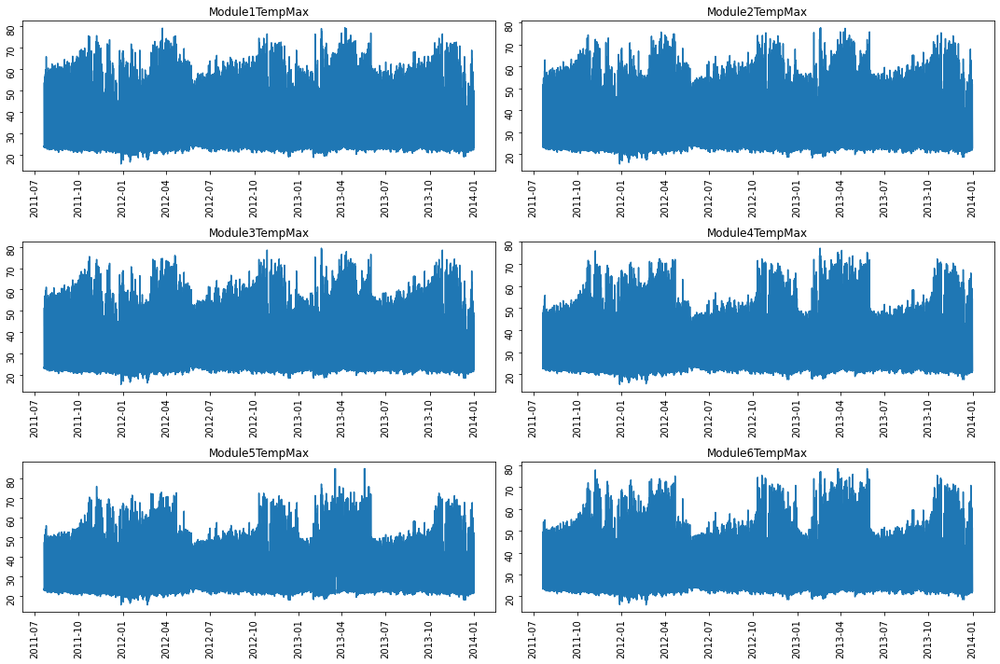

In [13]:
fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(15,10))

ax[0,0].plot(df['Module1TempMax'])
#ax[0,0].set_xticklabels(labels=df['Date'],rotation=90)
ax[0,0].tick_params(rotation=90)
ax[0,0].set_title('Module1TempMax')

ax[0,1].plot(df['Module2TempMax'])
ax[0,1].set_title('Module2TempMax')
ax[0,1].tick_params(rotation=90)

ax[1,0].plot(df['Module3TempMax'])
ax[1,0].set_title('Module3TempMax')
ax[1,0].tick_params(rotation=90)

ax[1,1].plot(df['Module4TempMax'])
ax[1,1].set_title('Module4TempMax')
ax[1,1].tick_params(rotation=90)

ax[2,0].plot(df['Module5TempMax'])
ax[2,0].set_title('Module5TempMax')
ax[2,0].tick_params(rotation=90)

ax[2,1].plot(df['Module6TempMax'])
ax[2,1].set_title('Module6TempMax')
ax[2,1].tick_params(rotation=90)

fig.tight_layout()
plt.show()

#### e). Module Temperature (Min)

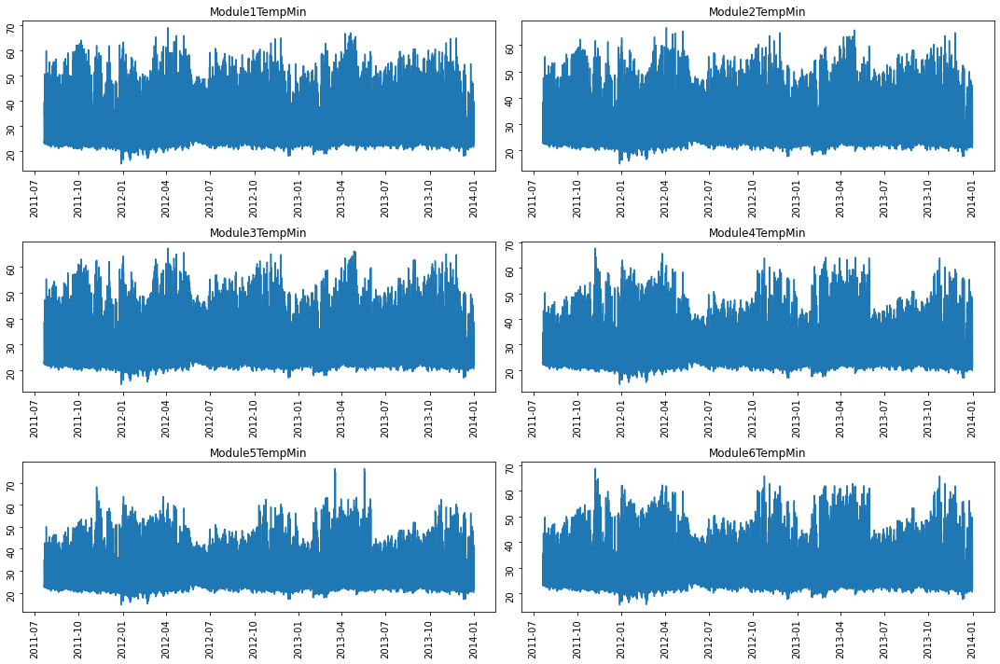

In [14]:
fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(15,10))

ax[0,0].plot(df['Module1TempMin'])
ax[0,0].tick_params(rotation=90)
ax[0,0].set_title('Module1TempMin')

ax[0,1].plot(df['Module2TempMin'])
ax[0,1].set_title('Module2TempMin')
ax[0,1].tick_params(rotation=90)

ax[1,0].plot(df['Module3TempMin'])
ax[1,0].set_title('Module3TempMin')
ax[1,0].tick_params(rotation=90)

ax[1,1].plot(df['Module4TempMin'])
ax[1,1].set_title('Module4TempMin')
ax[1,1].tick_params(rotation=90)

ax[2,0].plot(df['Module5TempMin'])
ax[2,0].set_title('Module5TempMin')
ax[2,0].tick_params(rotation=90)

ax[2,1].plot(df['Module6TempMin'])
ax[2,1].set_title('Module6TempMin')
ax[2,1].tick_params(rotation=90)

fig.tight_layout()
plt.show()

#### f). Precipitation

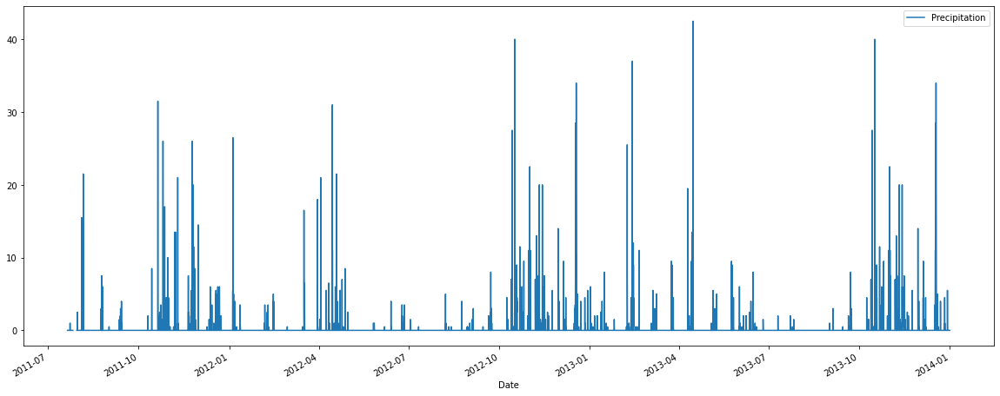

In [15]:
df[['Precipitation']].plot(figsize = (20,8));

#### g). GlobalSolarRadiation

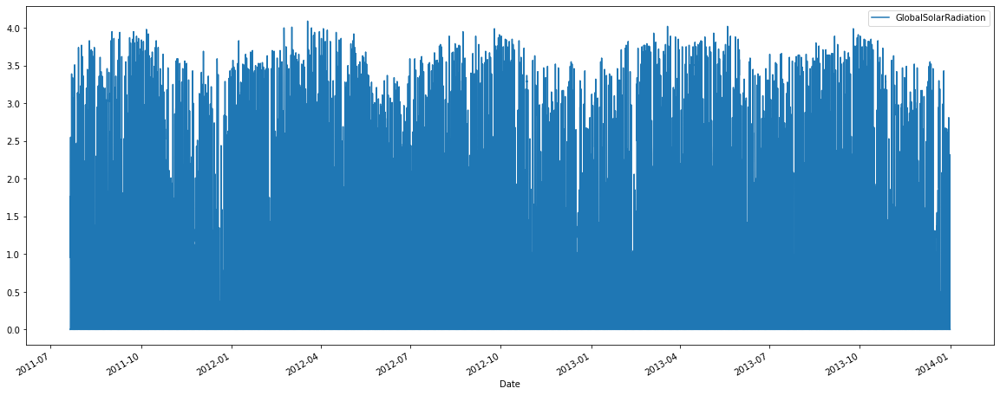

In [16]:
df[['GlobalSolarRadiation']].plot(figsize = (20,8));

#### h).Tilt Solar Irradiance

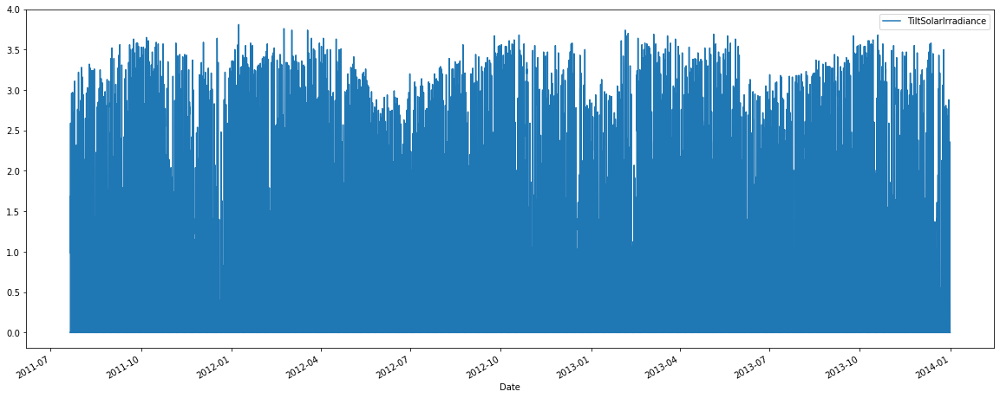

In [17]:
df[['TiltSolarIrradiance']].plot(figsize = (20,8));

#### i). Diffuse Solar Irradiance

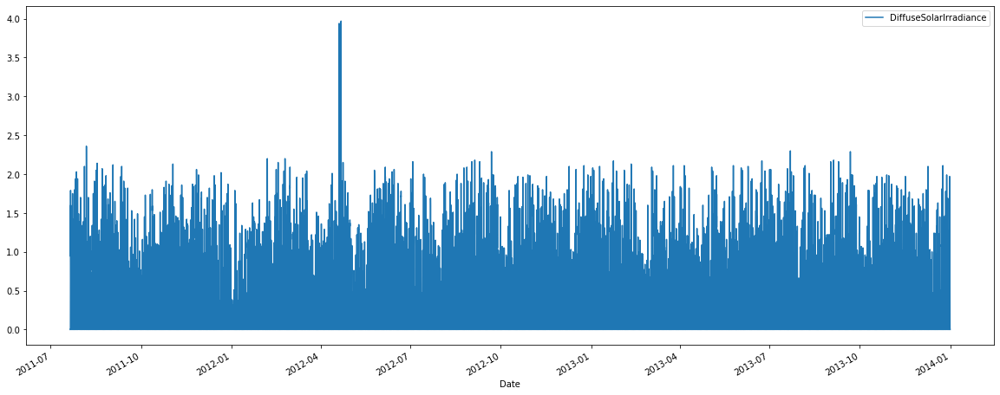

In [18]:
df[['DiffuseSolarIrradiance']].plot(figsize = (20,8));

In [19]:
df['DiffuseSolarIrradiance'][df['DiffuseSolarIrradiance']>2.5]

Date
2012-04-19 10:00:00    2.69
2012-04-19 11:00:00    3.32
2012-04-19 12:00:00    3.81
2012-04-19 13:00:00    3.94
2012-04-20 10:00:00    2.53
2012-04-20 11:00:00    3.54
2012-04-20 12:00:00    2.82
2012-04-21 10:00:00    2.69
2012-04-21 11:00:00    3.34
2012-04-21 12:00:00    3.89
2012-04-21 13:00:00    3.97
2012-04-21 14:00:00    3.47
Name: DiffuseSolarIrradiance, dtype: float64

In [20]:
df_power = df.reset_index()

fig = px.line(df_power, x='Date', y='DiffuseSolarIrradiance', title = 'DiffuseSolarIrradiance with slider')

fig.update_xaxes(
    rangeslider_visible = True,
    rangeselector = dict(
    )
)

fig.show()

These high values happened during 19 - 21 Apr 2012. These may be outliers or measurnment errors.

#### j). Energy

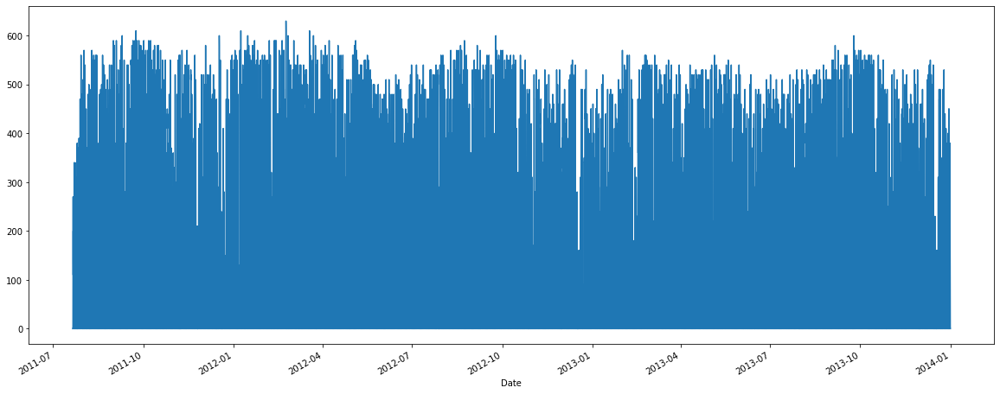

In [21]:
df['Energy'].plot(figsize = (20,8));

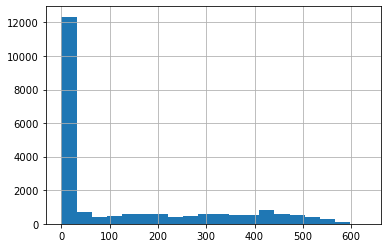

In [22]:
df['Energy'].hist(bins = 20);

#### k). Power Generation

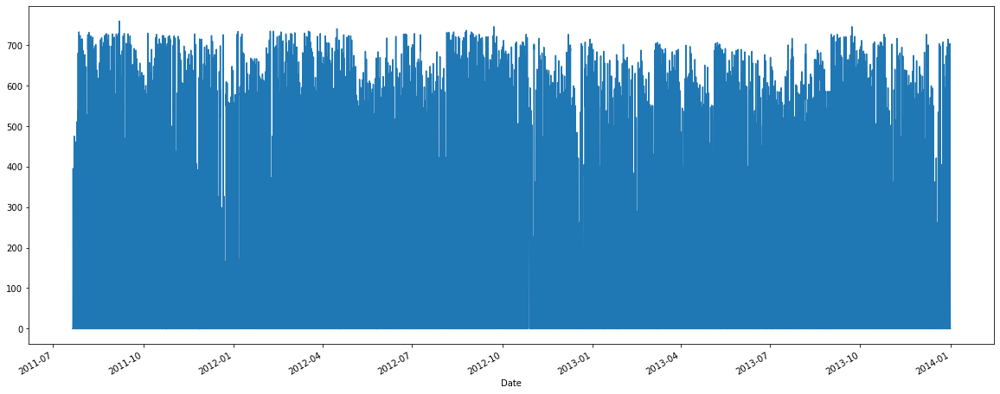

In [23]:
df['PowerMax'].plot(figsize = (20,8));

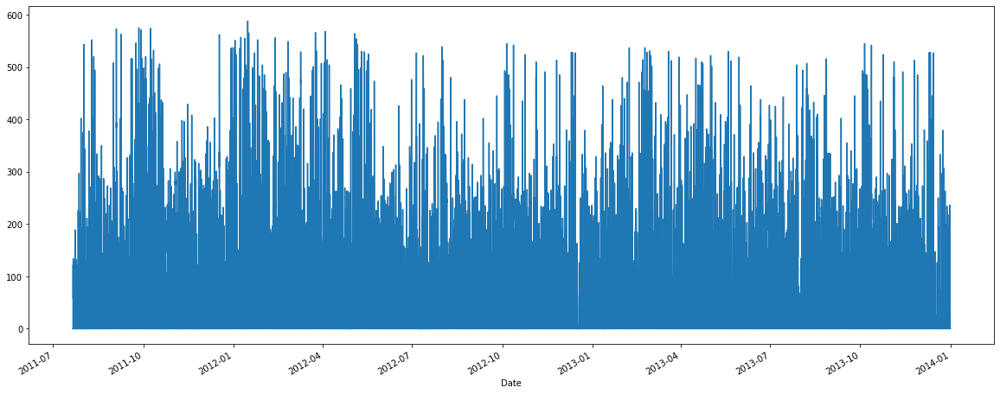

In [24]:
df['PowerMin'].plot(figsize = (20,8));

In [25]:
#! pip install plotly==5.8.0

In [26]:
#df_power = df.reset_index()
df_power.head()

,Date,Dates,Year,Month,Day,Hour,MeanWS,MeanWD,MaxGustWS,MaxGustWD,OpenAirTempInst,OpenAirTempMax,OpenAirTempMin,Module1TempInst,Module1TempMax,Module1TempMin,Module2TempInst,Module2TempMax,Module2TempMin,Module3TempInst,Module3TempMax,Module3TempMin,Module4TempInst,Module4TempMax,Module4TempMin,Module5TempInst,Module5TempMax,Module5TempMin,Module6TempInst,Module6TempMax,Module6TempMin,Precipitation,GlobalSolarRadiation,TiltSolarIrradiance,DiffuseSolarIrradiance,PowerInst,PowerMax,PowerMin,Energy,CO2Reduction
0,2011-07-21 01:00:00,2011-07-21 00:00:00,2011,7,21,1,5.0,WSW,8.2,WSW,25.6,25.6,25.5,23.9,24.0,23.8,23.4,23.5,23.3,23.4,23.4,23.2,23.0,23.0,22.9,23.3,23.4,23.2,23.8,23.8,23.6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2011-07-21 02:00:00,2011-07-21 00:00:00,2011,7,21,2,3.6,WSW,6.8,SW,25.5,25.6,25.4,24.2,24.2,23.8,23.7,23.7,23.4,23.6,23.6,23.2,23.4,23.4,22.8,23.6,23.6,23.1,24.1,24.1,23.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2011-07-21 03:00:00,2011-07-21 00:00:00,2011,7,21,3,4.0,WSW,6.7,WSW,25.7,25.8,25.5,23.8,24.2,23.7,23.3,23.7,23.2,23.2,23.6,23.1,23.0,23.5,22.9,23.3,23.8,23.2,23.8,24.4,23.7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2011-07-21 04:00:00,2011-07-21 00:00:00,2011,7,21,4,3.2,WSW,5.9,WSW,25.3,25.7,25.3,23.4,24.0,23.4,23.0,23.5,23.0,22.9,23.4,22.9,22.5,23.2,22.5,22.8,23.5,22.8,23.3,24.0,23.3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2011-07-21 05:00:00,2011-07-21 00:00:00,2011,7,21,5,3.8,WSW,5.5,WSW,25.2,25.4,25.1,23.3,23.5,23.3,22.8,23.0,22.8,22.8,22.9,22.7,22.3,22.5,22.3,22.6,22.8,22.6,23.1,23.2,23.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [27]:
fig = px.line(df_power, x='Date', y='PowerMax', title = 'PowerMax with slider')

fig.update_xaxes(
    rangeslider_visible = True,
    rangeselector = dict(
       # buttons = list([
       #     dict(count=1, label='2011', step='year', stepmode='backward'),
        #    dict(count=2, label='2012', step='year', stepmode='backward'),
        #    dict(count=3, label='2013', step='year', stepmode='backward'),
        #    dict(step='all')
      #  ])
    )
)

fig.show()

In [28]:
fig = px.line(df_power, x='Date', y='PowerMin', title = 'PowerMin with slider')

fig.update_xaxes(
    rangeslider_visible = True,
    rangeselector = dict(
        #buttons = list([
           # dict(count=1, label='2011', step='year', stepmode='backward'),
           # dict(count=2, label='2012', step='year', stepmode='backward'),
           # dict(count=3, label='2013', step='year', stepmode='backward'),
           # dict(step='all')
       # ])
    )
)

fig.show()

### 2.4.2 Average daily profile

In [29]:
df_Avg = df_power.copy()
df_Avg = df_Avg.groupby(df_Avg['Hour']).mean()
df_Avg

,Year,Month,Day,MeanWS,MaxGustWS,OpenAirTempInst,OpenAirTempMax,OpenAirTempMin,Module1TempInst,Module1TempMax,Module1TempMin,Module2TempInst,Module2TempMax,Module2TempMin,Module3TempInst,Module3TempMax,Module3TempMin,Module4TempInst,Module4TempMax,Module4TempMin,Module5TempInst,Module5TempMax,Module5TempMin,Module6TempInst,Module6TempMax,Module6TempMin,Precipitation,GlobalSolarRadiation,TiltSolarIrradiance,DiffuseSolarIrradiance,PowerInst,PowerMax,PowerMin,Energy,CO2Reduction
Hour,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,2012.227933,7.131844,15.821229,2.757877,5.200670,24.763575,25.082458,24.659665,23.043911,23.368268,22.895084,22.407374,22.732067,22.253855,22.311620,22.632737,22.156425,21.869609,22.186704,21.722905,22.346682,22.668954,22.175169,22.530391,22.846592,22.366145,0.135090,0.000000,0.000000,0.000000,0.001120,0.068309,0.000000,0.000000,0.000000
1,2012.225951,7.120805,15.860179,2.778412,5.257383,24.561186,24.873714,24.457383,22.854139,23.175056,22.716443,22.216107,22.538031,22.077629,22.121365,22.443289,21.981767,21.682327,21.994966,21.542841,22.013063,22.327365,21.873649,22.349776,22.660738,22.196085,0.170034,0.000000,0.000000,0.000000,0.000000,0.067189,0.000000,0.000000,0.000000
2,2012.224581,7.120670,15.875978,2.754525,5.197095,24.405028,24.675531,24.287039,22.716089,23.012626,22.568380,22.084246,22.374637,21.930615,21.991732,22.280000,21.838436,21.552514,21.835531,21.404469,21.878065,22.167492,21.731384,22.224916,22.508268,22.068045,0.132997,0.000000,0.000000,0.000000,0.000000,0.063758,0.000000,0.000000,0.000000
3,2012.224581,7.120670,15.875978,2.733073,5.120335,24.263911,24.522570,24.147374,22.600335,22.866592,22.451955,21.959106,22.235531,21.809832,21.872626,22.146592,21.721229,21.423017,21.695642,21.286704,21.747357,22.024409,21.606862,22.102346,22.377430,21.950838,0.170034,0.000000,0.000000,0.000000,0.003356,0.069351,0.000000,0.000000,0.000000
4,2012.224581,7.120670,15.875978,2.748268,5.142682,24.145810,24.390615,24.015196,22.466257,22.744022,22.320223,21.827598,22.111732,21.677430,21.740559,22.022682,21.591508,21.301899,21.571955,21.152626,21.632508,21.897750,21.472553,21.984134,22.255642,21.826034,0.085859,0.000000,0.000000,0.000000,0.001120,0.086130,0.000000,0.000000,0.000000
5,2012.224581,7.120670,15.875978,2.737207,5.132402,24.048156,24.293966,23.913743,22.364693,22.627374,22.204916,21.730279,21.997318,21.559888,21.643128,21.904916,21.475196,21.203128,21.456760,21.046480,21.526772,21.788639,21.362880,21.889497,22.152291,21.719888,0.067901,0.000000,0.000000,0.000000,0.000000,0.067189,0.000000,0.000000,0.000000
6,2012.224581,7.120670,15.875978,2.704469,5.117542,23.967374,24.193296,23.823911,22.323687,22.543017,22.126145,21.690056,21.907598,21.478883,21.601899,21.817877,21.395642,21.162682,21.365587,20.971397,21.486839,21.697300,21.290664,21.851732,22.064693,21.648603,0.082492,0.000145,0.000626,0.000156,0.060538,0.092945,0.000000,0.000000,0.000000
7,2012.224581,7.120670,15.875978,2.728827,5.066704,24.712737,24.748268,23.882682,24.493073,24.508603,22.302682,24.349497,24.365698,21.661117,24.246480,24.262458,21.576983,23.615642,23.631732,21.138659,23.973903,23.989539,21.464679,24.321453,24.337095,21.827821,0.062851,0.170469,0.188816,0.132659,66.010112,67.636058,0.040314,22.849162,4.112849
8,2012.224581,7.120670,15.875978,3.368939,6.109497,26.617654,26.681564,24.715866,33.368939,33.562682,24.535196,33.397877,33.620447,24.405475,33.145363,33.355196,24.303687,31.581899,31.782682,23.663799,31.778065,31.984364,24.019235,32.117654,32.335531,24.364022,0.086981,0.807877,0.882782,0.429899,196.030440,213.402466,57.764574,129.575419,23.323575


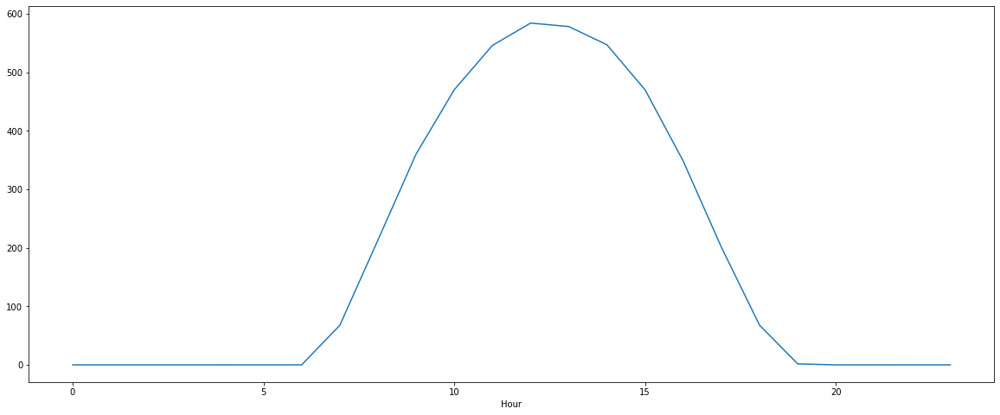

In [30]:
df_Avg['PowerMax'].plot(figsize = (20,8));

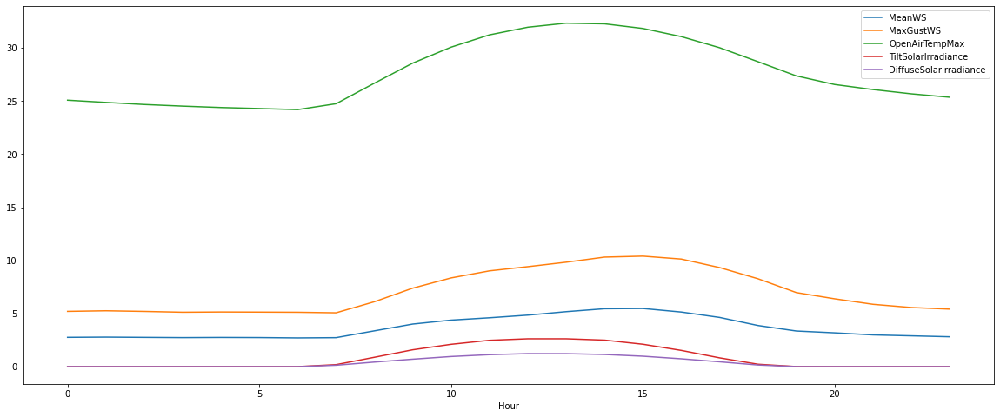

In [31]:
df_Avg[['MeanWS','MaxGustWS','OpenAirTempMax','TiltSolarIrradiance','DiffuseSolarIrradiance']].plot(figsize = (20,8));

### 2.4.3 Distribution of parameters for a specific day 

In [32]:
df_jan01 = df.loc['2013-01-01']
df_jan01

,Dates,Year,Month,Day,Hour,MeanWS,MeanWD,MaxGustWS,MaxGustWD,OpenAirTempInst,OpenAirTempMax,OpenAirTempMin,Module1TempInst,Module1TempMax,Module1TempMin,Module2TempInst,Module2TempMax,Module2TempMin,Module3TempInst,Module3TempMax,Module3TempMin,Module4TempInst,Module4TempMax,Module4TempMin,Module5TempInst,Module5TempMax,Module5TempMin,Module6TempInst,Module6TempMax,Module6TempMin,Precipitation,GlobalSolarRadiation,TiltSolarIrradiance,DiffuseSolarIrradiance,PowerInst,PowerMax,PowerMin,Energy,CO2Reduction
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2013-01-01 00:00:00,2013-01-01 00:00:00,2013,1,1,0,2.9,W,6.4,WSW,24.3,24.5,24.3,23.3,23.5,23.3,22.7,22.8,22.6,22.5,22.7,22.5,22.1,22.3,22.1,22.5,22.7,22.5,22.7,22.9,22.7,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0
2013-01-01 01:00:00,2013-01-01 00:00:00,2013,1,1,1,3.9,W,6.0,WSW,24.1,24.1,23.9,22.9,22.9,22.7,22.2,22.2,22.0,22.1,22.1,21.8,21.7,21.7,21.5,22.0,22.0,21.9,22.3,22.3,22.1,0.0,0.00,0.00,0.00,0.0,1.0,0.0,0.0,0.0
2013-01-01 02:00:00,2013-01-01 00:00:00,2013,1,1,2,3.0,WSW,6.2,W,24.2,24.3,24.1,22.8,23.0,22.6,22.1,22.3,22.0,21.9,22.1,21.8,21.6,21.8,21.6,22.0,22.1,21.9,22.2,22.4,22.2,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0
2013-01-01 03:00:00,2013-01-01 00:00:00,2013,1,1,3,4.8,W,7.8,W,24.8,24.8,24.2,23.5,23.5,22.8,22.8,22.8,22.1,22.7,22.7,22.0,22.3,22.3,21.6,22.6,22.6,22.0,22.8,22.8,22.2,0.0,0.00,0.00,0.00,0.0,1.0,0.0,0.0,0.0
2013-01-01 04:00:00,2013-01-01 00:00:00,2013,1,1,4,6.1,W,11.3,W,24.1,24.9,24.1,23.4,23.9,23.3,22.7,23.2,22.7,22.5,23.0,22.5,22.0,22.5,22.0,22.4,22.9,22.4,22.6,23.1,22.6,0.5,0.00,0.00,0.00,0.0,1.0,0.0,0.0,0.0
2013-01-01 05:00:00,2013-01-01 00:00:00,2013,1,1,5,4.7,WSW,13.1,W,23.2,24.1,23.2,22.1,23.4,22.1,21.4,22.7,21.4,21.3,22.5,21.2,20.9,22.0,20.8,21.2,22.4,21.2,21.5,22.6,21.5,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0
2013-01-01 06:00:00,2013-01-01 00:00:00,2013,1,1,6,2.4,WSW,9.3,WSW,23.3,23.3,23.2,22.1,22.3,22.1,21.5,21.6,21.4,21.3,21.4,21.3,21.0,21.0,20.9,21.3,21.4,21.2,21.6,21.7,21.5,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0
2013-01-01 07:00:00,2013-01-01 00:00:00,2013,1,1,7,3.7,WSW,6.3,W,23.8,23.8,23.1,23.5,23.5,22.2,23.0,23.0,21.5,23.0,23.0,21.3,22.9,22.9,21.0,23.3,23.3,21.3,23.5,23.5,21.6,0.0,0.21,0.19,0.18,65.0,65.0,0.0,20.0,3.6
2013-01-01 08:00:00,2013-01-01 00:00:00,2013,1,1,8,3.8,WSW,6.5,W,25.8,25.8,23.8,32.3,32.3,23.6,31.4,31.4,23.2,31.3,31.3,23.1,29.2,29.2,23.1,29.7,29.7,23.5,30.0,30.0,23.6,0.0,0.66,0.64,0.55,192.0,192.0,42.0,100.0,18.0


Text(0, 0.5, 'Wind Speed,m/s')

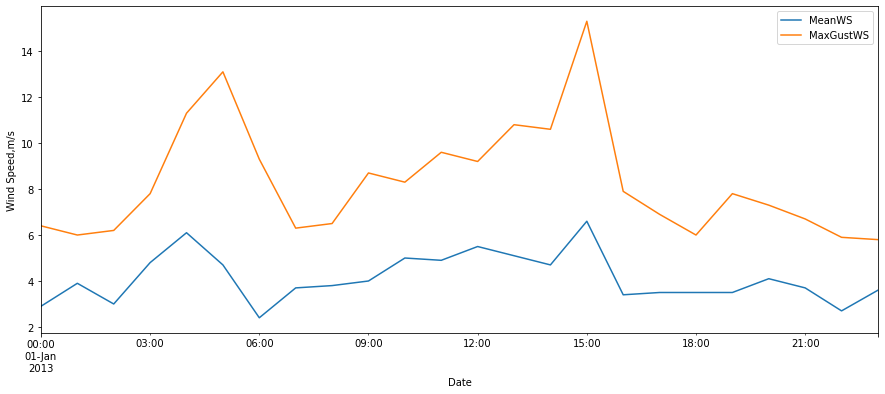

In [33]:
# Wind Speed
df_jan01[['MeanWS','MaxGustWS']].plot(figsize=(15,6))
plt.ylabel('Wind Speed,m/s')

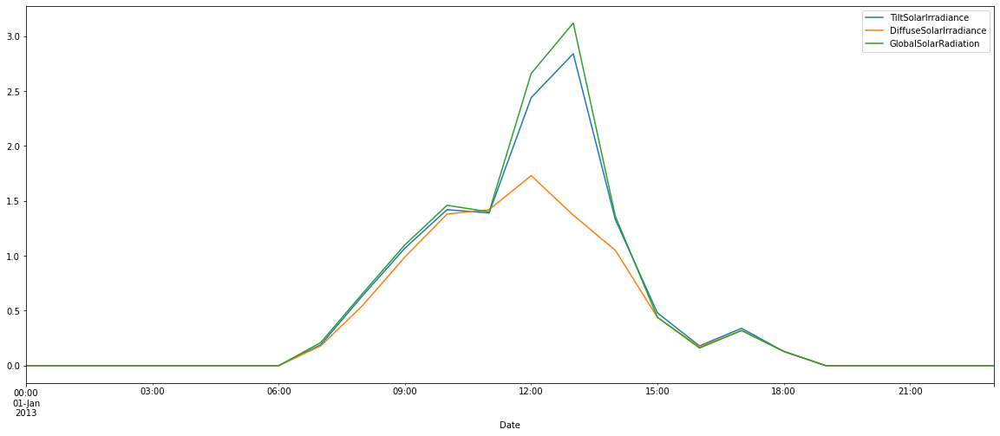

In [34]:
# Distribution of solar irradiance
df_jan01[['TiltSolarIrradiance','DiffuseSolarIrradiance','GlobalSolarRadiation']].plot(figsize = (20,8));

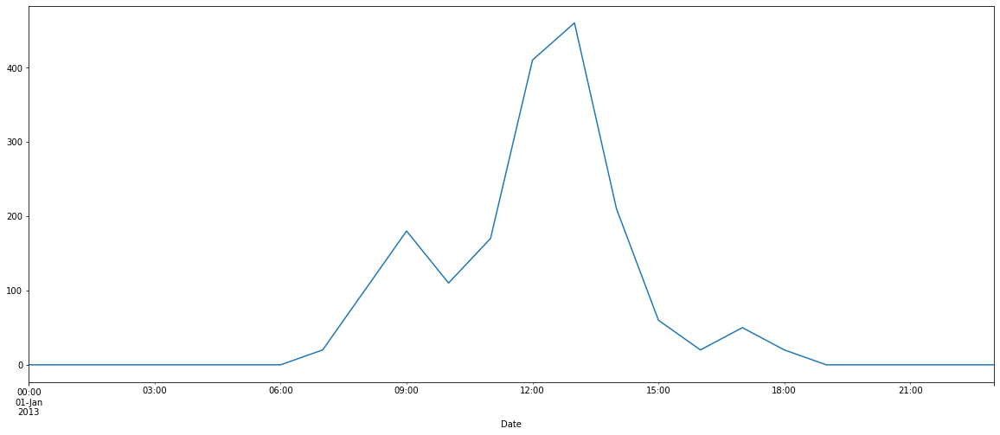

In [35]:
df_jan01['Energy'].plot(figsize = (20,8));

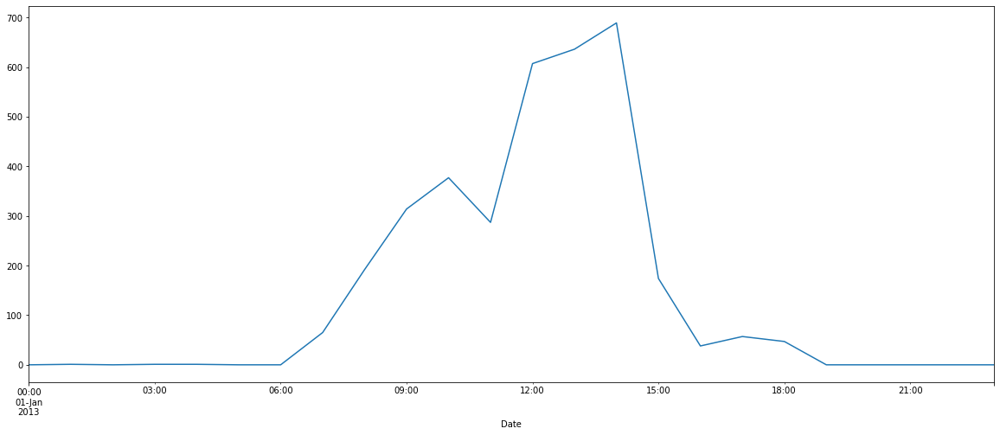

In [36]:
df_jan01['PowerMax'].plot(figsize = (20,8));

### 2.4.4 Averagy monthly profile

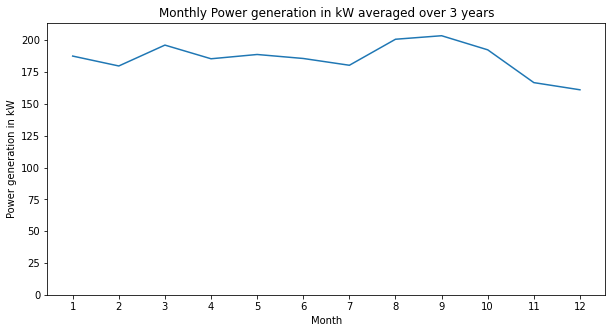

In [37]:
# Maximum power
df_power.groupby('Month')['PowerMax'].mean().plot(figsize = (10,5))
_ = plt.ylabel('Power generation in kW')
_ = plt.ylim([0, max(df_power.groupby('Month')['PowerMax'].mean()) + 10])
_ = plt.xticks(df_power['Month'].unique())
_ = plt.title('Monthly Power generation in kW averaged over 3 years')

Power generation is high in August, September and October months

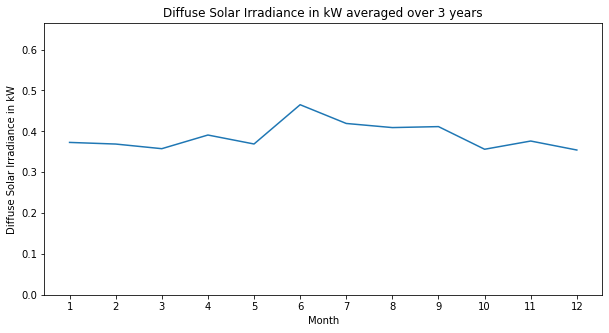

In [38]:
# SolarIrradiance
df_power.groupby('Month')['DiffuseSolarIrradiance'].mean().plot(figsize = (10,5))
_ = plt.ylabel('Diffuse Solar Irradiance in kW')
_ = plt.ylim([0, max(df_power.groupby('Month')['DiffuseSolarIrradiance'].mean()+0.2)])
_ = plt.xticks(df_power['Month'].unique())
_ = plt.title('Diffuse Solar Irradiance in kW averaged over 3 years')

In [39]:
# Wind Speed
#month[['MeanWS','MaxGustWS']].plot(figsize=(15,6))
#plt.ylabel('Wind Speed,m/s')

## 2.5 Auto Correlation

In [40]:
# Create a dataframe by dropping null values
df_na = df.copy()
df_na = df_na.dropna()

In [41]:
df_na.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 21094 entries, 2011-07-21 01:00:00 to 2013-12-31 23:00:00
Data columns (total 39 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Dates                   21094 non-null  object 
 1   Year                    21094 non-null  int64  
 2   Month                   21094 non-null  int64  
 3   Day                     21094 non-null  int64  
 4   Hour                    21094 non-null  int64  
 5   MeanWS                  21094 non-null  float64
 6   MeanWD                  21094 non-null  object 
 7   MaxGustWS               21094 non-null  float64
 8   MaxGustWD               21094 non-null  object 
 9   OpenAirTempInst         21094 non-null  float64
 10  OpenAirTempMax          21094 non-null  float64
 11  OpenAirTempMin          21094 non-null  float64
 12  Module1TempInst         21094 non-null  float64
 13  Module1TempMax          21094 non-null  float64
 14  Mod

<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

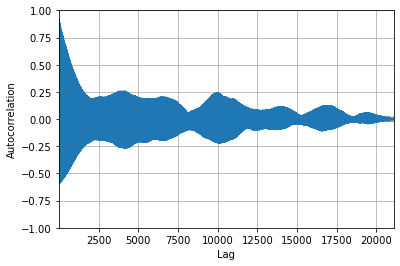

In [42]:
pd.plotting.autocorrelation_plot(df_na['2011':'2013']['PowerMax'])

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 1)'>

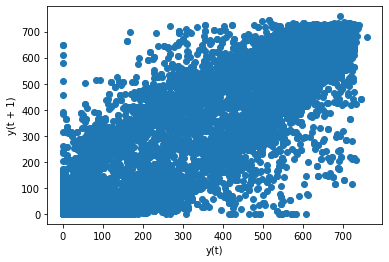

In [43]:
pd.plotting.lag_plot(df_na['PowerMax'],lag=1)

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 7)'>

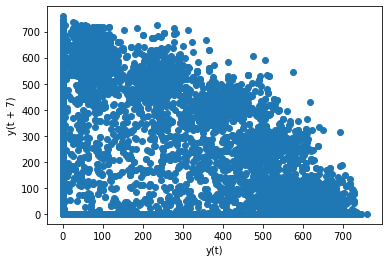

In [44]:
pd.plotting.lag_plot(df_na['PowerMax'],lag=7)

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 24)'>

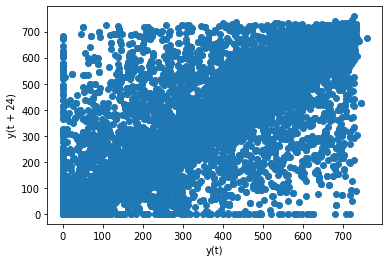

In [45]:
pd.plotting.lag_plot(df_na['PowerMax'],lag=24)

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 8640)'>

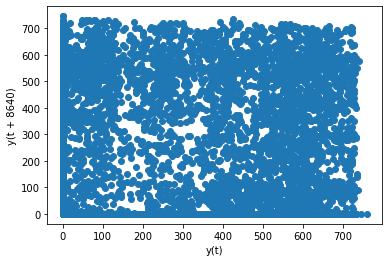

In [46]:
pd.plotting.lag_plot(df_na['PowerMax'],lag=8640)